<a href="https://colab.research.google.com/github/mamtapatilkinge/Class-Work/blob/main/Projecct_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#importing pandas library for data handling and manipulation
import pandas as pd 
#importing numpy for scientific calculation 
import numpy as np
#importing pyplot module from matplotlib for data visualization including seaborn as sns 
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler


Problem statement-https://docs.google.com/document/d/1oBNrkBZ0sDKHwUQyIa59N2KVsuZqOBjK/edit

# **Table of content**


1.   Read data
2.   data cleaning 

  *   missing values 
  *   duplicate values
 

3.   visualization 
4.   feature importance
5.   auto Eda








# 1). Read Data:

In [ ]:
data = pd.read_csv("https://raw.githubusercontent.com/omgo101/dataset-/main/project-data.csv", sep = ';') #loading dataset

In [ ]:
data #displaying dataset

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
0,no_disease,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69
1,no_disease,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,no_disease,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,no_disease,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,no_disease,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82
613,cirrhosis,46,f,33.0,NaN,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71


In [ ]:
# Summary statistics
print(data.describe())


              age     albumin  alkaline_phosphatase  alanine_aminotransferase  \
count  615.000000  614.000000            597.000000                614.000000   
mean    47.408130   41.620195             68.283920                 28.450814   
std     10.055105    5.780629             26.028315                 25.469689   
min     19.000000   14.900000             11.300000                  0.900000   
25%     39.000000   38.800000             52.500000                 16.400000   
50%     47.000000   41.950000             66.200000                 23.000000   
75%     54.000000   45.200000             80.100000                 33.075000   
max     77.000000   82.200000            416.600000                325.300000   

       aspartate_aminotransferase   bilirubin  cholinesterase  cholesterol  \
count                  615.000000  615.000000      615.000000   605.000000   
mean                    34.786341   11.396748        8.196634     5.368099   
std                     33.090690   

In [ ]:
# data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 615 entries, 0 to 614
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   category                     615 non-null    object 
 1   age                          615 non-null    int64  
 2   sex                          615 non-null    object 
 3   albumin                      614 non-null    float64
 4   alkaline_phosphatase         597 non-null    float64
 5   alanine_aminotransferase     614 non-null    float64
 6   aspartate_aminotransferase   615 non-null    float64
 7   bilirubin                    615 non-null    float64
 8   cholinesterase               615 non-null    float64
 9   cholesterol                  605 non-null    float64
 10  creatinina                   615 non-null    float64
 11  gamma_glutamyl_transferase   615 non-null    float64
 12  protein                      615 non-null    object 
dtypes: float64(9), int64

In [ ]:
data['category'].value_counts()

 no_disease        533
 cirrhosis          30
 hepatitis          24
 fibrosis           21
suspect_disease      7
Name: category, dtype: int64

# **Data balancing**

In [ ]:
X = data.drop('category', axis=1)
y = data['category']

In [ ]:
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)


In [ ]:
df_resampled = pd.concat([pd.DataFrame(X_resampled), pd.DataFrame(y_resampled)], axis=1)


In [ ]:
df_resampled.to_csv('balanced_dataset.csv', index=False)


In [ ]:
datab=pd.read_csv("/content/balanced_dataset.csv")

In [ ]:
datab['category'].value_counts()

 no_disease        533
suspect_disease    533
 hepatitis         533
 fibrosis          533
 cirrhosis         533
Name: category, dtype: int64

In [ ]:

print(datab.isnull().sum())

age                              0
sex                              0
albumin                         15
alkaline_phosphatase           418
alanine_aminotransferase        28
aspartate_aminotransferase       0
bilirubin                        0
cholinesterase                   0
cholesterol                     64
creatinina                       0
gamma_glutamyl_transferase       0
protein                          0
category                         0
dtype: int64


In [ ]:
#lets imputes misssing values with mean 
# calculate the mean of the column and fill missing values with it
datab['albumin'].fillna(datab['albumin'].mean(), inplace=True)
datab['alkaline_phosphatase'].fillna(datab['alkaline_phosphatase'].mean(), inplace=True)
datab['cholesterol'].fillna(datab['cholesterol'].mean(), inplace=True)
datab['alanine_aminotransferase'].fillna(datab['alanine_aminotransferase'].mean(), inplace=True)
# verify that there are no more missing values
print(datab.isnull().sum())

age                            0
sex                            0
albumin                        0
alkaline_phosphatase           0
alanine_aminotransferase       0
aspartate_aminotransferase     0
bilirubin                      0
cholinesterase                 0
cholesterol                    0
creatinina                     0
gamma_glutamyl_transferase     0
protein                        0
category                       0
dtype: int64


# DATATYPE COVERSION 

In [ ]:
data = data.rename(columns={'protein   ': 'protein'})
data["protein"] = data["protein"].replace('NA    ', np.nan)

In [ ]:
# convert the protein column to float64
data["protein"] = data["protein"].astype("float64")

# print the resulting dataframe with the updated data types
print(data.dtypes)

category                        object
age                              int64
sex                             object
albumin                        float64
alkaline_phosphatase           float64
alanine_aminotransferase       float64
aspartate_aminotransferase     float64
bilirubin                      float64
cholinesterase                 float64
cholesterol                    float64
creatinina                     float64
gamma_glutamyl_transferase     float64
protein                        float64
dtype: object


# 2)Data Cleaning

In [ ]:
# Missing values
print(data.isnull().sum())

category                        0
age                             0
sex                             0
albumin                         1
alkaline_phosphatase           18
alanine_aminotransferase        1
aspartate_aminotransferase      0
bilirubin                       0
cholinesterase                  0
cholesterol                    10
creatinina                      0
gamma_glutamyl_transferase      0
protein                         1
dtype: int64


In [ ]:
# print rows with null values
print(data[data.isnull().any(axis=1)])

        category  age sex  albumin  alkaline_phosphatase  \
121   no_disease   43   m     48.6                  45.0   
319   no_disease   32   f     47.4                  52.5   
329   no_disease   33   f     42.4                 137.2   
413   no_disease   46   f     42.9                  55.1   
424   no_disease   48   f     45.6                 107.2   
433   no_disease   48   f     46.8                  93.3   
498   no_disease   57   f     48.4                  94.4   
540    hepatitis   38   m     45.0                  56.3   
541    hepatitis   19   m     41.0                   NaN   
545    hepatitis   29   m     49.0                   NaN   
546    hepatitis   30   m     45.0                   NaN   
568     fibrosis   49   m     39.0                   NaN   
569     fibrosis   49   m     46.0                   NaN   
570     fibrosis   50   m     42.0                   NaN   
571     fibrosis   53   m     46.0                   NaN   
576     fibrosis   71   m     37.0      

there are null values in albumin,alkaline_phosphatase,cholesterol

# Checking for duplicate values 

In [ ]:
# check for duplicates in the dataframe
data.duplicated().sum()


0

there are no duplicates values 

# Handling missing values 

In [ ]:
#To fill the missing values in the "albumin", "alkaline_phosphatase", and "cholesterol" columns with the mean value of the respective column

In [ ]:
# calculate the mean of the column and fill missing values with it
data['albumin'].fillna(data['albumin'].mean(), inplace=True)
data['alkaline_phosphatase'].fillna(data['alkaline_phosphatase'].mean(), inplace=True)
data['cholesterol'].fillna(data['cholesterol'].mean(), inplace=True)
data['alanine_aminotransferase'].fillna(data['alanine_aminotransferase'].mean(), inplace=True)
data['protein'].fillna(data['protein'].mean(), inplace=True)
# verify that there are no more missing values
print(data.isnull().sum())

category                       0
age                            0
sex                            0
albumin                        0
alkaline_phosphatase           0
alanine_aminotransferase       0
aspartate_aminotransferase     0
bilirubin                      0
cholinesterase                 0
cholesterol                    0
creatinina                     0
gamma_glutamyl_transferase     0
protein                        0
dtype: int64


# Feature importance by random forest

In [ ]:
data

,category,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
0,no_disease,32,m,38.5,52.50000,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,no_disease,32,m,38.5,70.30000,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,no_disease,32,m,46.9,74.70000,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,no_disease,32,m,43.2,52.00000,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,no_disease,32,m,39.2,74.10000,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,cirrhosis,62,f,32.0,416.60000,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,cirrhosis,64,f,24.0,102.80000,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,cirrhosis,64,f,29.0,87.30000,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,cirrhosis,46,f,33.0,68.28392,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


In [ ]:
X = data.iloc[:,1:]
y = data.iloc[:,0]

In [ ]:
print(data.dtypes)

category                        object
age                              int64
sex                             object
albumin                        float64
alkaline_phosphatase           float64
alanine_aminotransferase       float64
aspartate_aminotransferase     float64
bilirubin                      float64
cholinesterase                 float64
cholesterol                    float64
creatinina                     float64
gamma_glutamyl_transferase     float64
protein                        float64
dtype: object


In [ ]:
# create a new DataFrame with the one-hot encoded 'sex' column
df_encoded = pd.concat([data, pd.get_dummies(data['sex'], prefix='sex')], axis=1)

# remove the original 'sex' column from the DataFrame
df_encoded.drop('sex', axis=1, inplace=True)

# confirm the data types of each column
print(df_encoded.dtypes)

category                        object
age                              int64
albumin                        float64
alkaline_phosphatase           float64
alanine_aminotransferase       float64
aspartate_aminotransferase     float64
bilirubin                      float64
cholinesterase                 float64
cholesterol                    float64
creatinina                     float64
gamma_glutamyl_transferase     float64
protein                        float64
sex_f                            uint8
sex_m                            uint8
dtype: object


In [ ]:
X = df_encoded.iloc[:,1:]
y = df_encoded.iloc[:,0]

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()

rf.fit(X,y)

RandomForestClassifier()

In [ ]:
rf.feature_importances_

array([0.05910958, 0.06104788, 0.08959042, 0.12345918, 0.23832505,
       0.07095231, 0.11395288, 0.04729541, 0.0447446 , 0.08610522,
       0.05624463, 0.00435686, 0.00481599])

age                           0.05910958
albumin                        0.06104788
alkaline_phosphatase           0.08959042       
alanine_aminotransferase       0.12345918
aspartate_aminotransferase      0.23832505,
bilirubin                      0.07095231,
cholinesterase                0.11395288,
cholesterol                     0.04729541,
creatinina                      0.0447446 ,
gamma_glutamyl_transferase     0.08610522,
protein                         0.05624463,
sex_f                           0.00435686,
sex_m                            0.00481599

and highest are aspartate_aminotransferase,bilirubin alanine_aminotransferas,cholinesterase,gamma_glutamyl_transferase,albumin,age   

we will remove less important feature sex,protein,cholesterol,creatinina 

In [ ]:
datab=data.drop(['sex', 'protein', 'cholesterol', 'creatinina'], axis=1)

# AUTO EDA

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (615, 13)
#######################################################################################
######################## C L A S S I

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
alkaline_phosphatase,415,float64,0,0.000000,67.479675,0,skewed: cap or drop outliers
cholinesterase,407,float64,0,0.000000,66.178862,0,
gamma_glutamyl_transferase,358,float64,0,0.000000,58.211382,0,highly skewed: drop outliers or do box-cox transform
alanine_aminotransferase,342,float64,0,0.000000,55.609756,0,highly skewed: drop outliers or do box-cox transform
cholesterol,314,float64,0,0.000000,51.056911,0,
aspartate_aminotransferase,297,float64,0,0.000000,48.292683,0,skewed: cap or drop outliers
protein,199,float64,0,0.000000,32.357724,0,
albumin,190,float64,0,0.000000,30.894309,0,
bilirubin,188,float64,0,0.000000,30.569106,0,highly skewed: drop outliers or do box-cox transform
creatinina,117,float64,0,0.000000,19.024390,0,highly skewed: drop outliers or do box-cox transform


  Printing upto 30 columns max in each category:
    Numeric Columns : ['albumin', 'alkaline_phosphatase', 'alanine_aminotransferase', 'aspartate_aminotransferase', 'bilirubin', 'cholinesterase', 'cholesterol', 'creatinina', 'gamma_glutamyl_transferase ', 'protein']
    Integer-Categorical Columns: ['age']
    String-Categorical Columns: ['category']
    Factor-Categorical Columns: []
    String-Boolean Columns: ['sex']
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: []
    Columns that will not be considered in modeling: []
    13 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
   Columns to delete:
'   []'
   Boolean variables %s 
"   ['sex']"
   Categorical variables %s 
"   ['category', 'age', 'sex']"
   Continuous variables %s 
("   ['albumin', 'alkaline_phosphatase', 'alanine_aminotransferase', "
 "'aspartate_aminotransferase', 'bilir

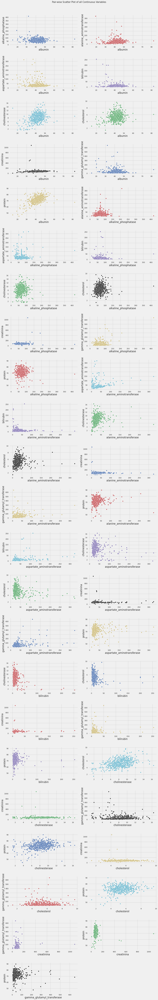

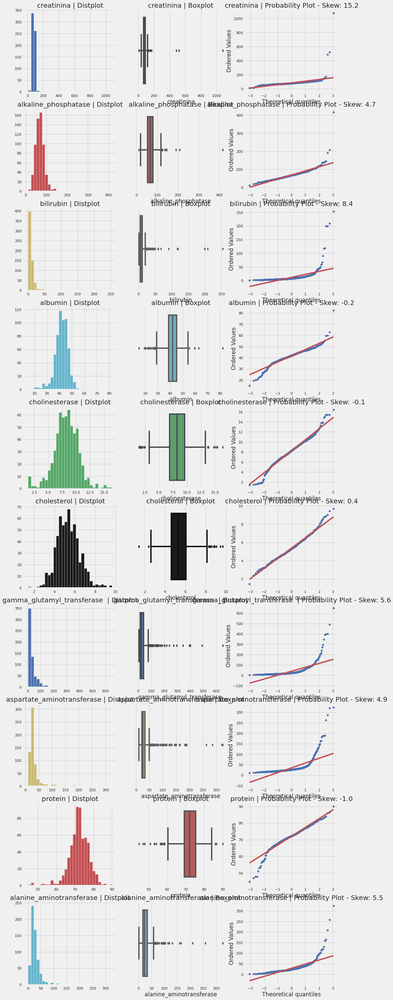

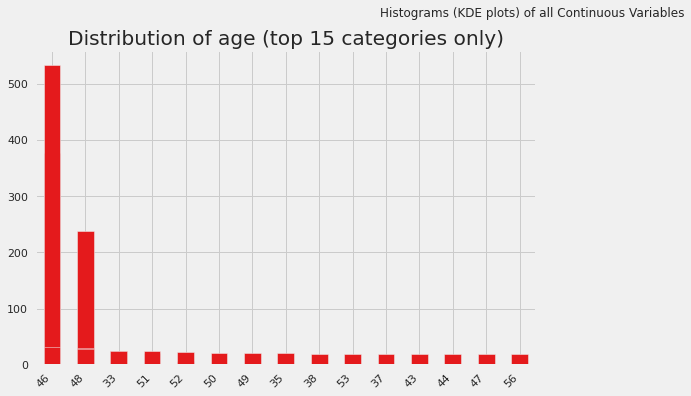

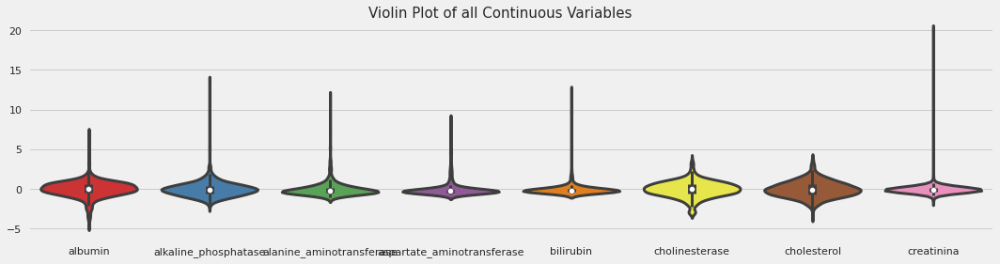

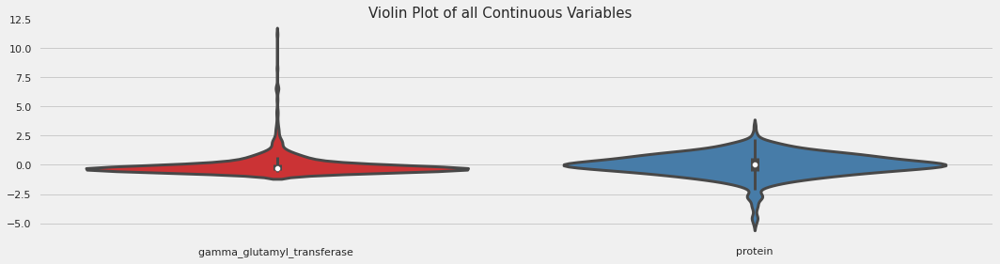

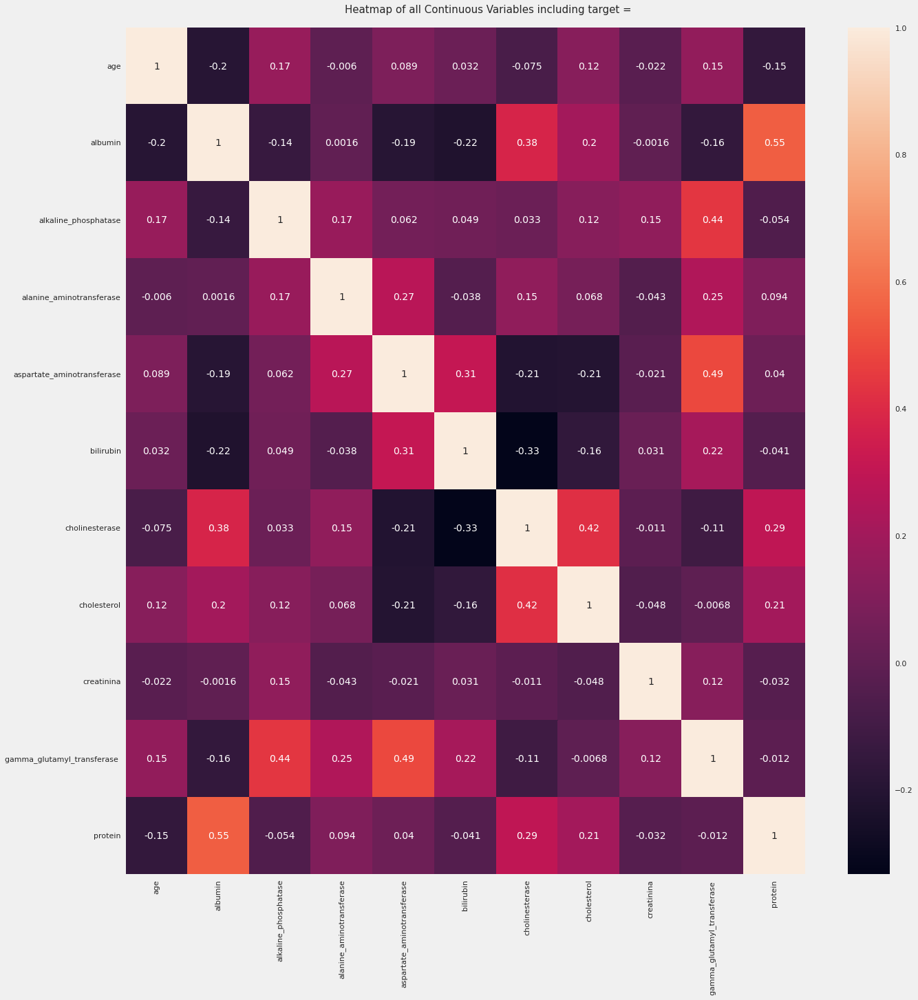

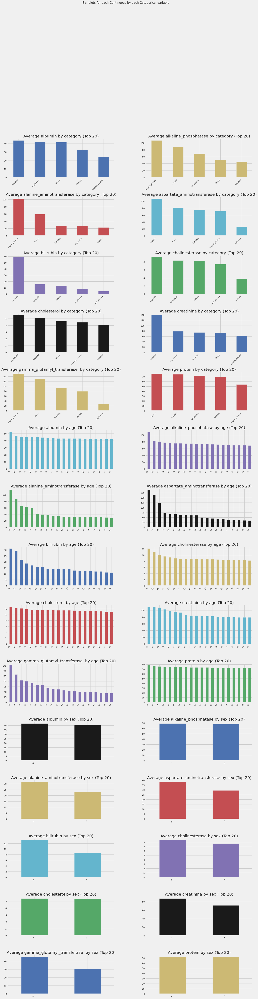

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

# Instantiate the AutoViz class and generate visualizations
AV = AutoViz_Class()
report = AV.AutoViz(filename="",sep=",", depVar="", dfte=data, header=0, verbose=2, 
                    lowess=False, chart_format='svg', max_rows_analyzed=150000, 
                    max_cols_analyzed=30)

# Visualization 

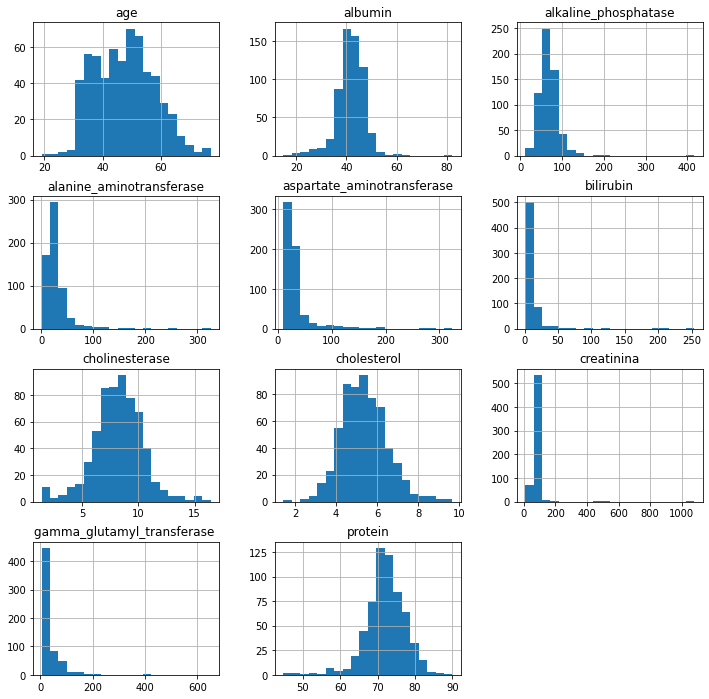

In [ ]:
data.hist(figsize=(12,12),bins=20)
plt.show()

In [ ]:
# Generating correlation coefficient between each features
from pandas import set_option
set_option("precision",3)
correlation=data.corr(method='pearson')
correlation

,age,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
age,1.000,-0.197,0.168,-0.006,0.089,0.032,-0.075,0.124,-0.022,0.153,-0.154
albumin,-0.197,1.000,-0.139,0.002,-0.193,-0.222,0.376,0.205,-0.002,-0.156,0.550
alkaline_phosphatase,0.168,-0.139,1.000,0.172,0.062,0.049,0.033,0.122,0.150,0.442,-0.054
alanine_aminotransferase,-0.006,0.002,0.172,1.000,0.273,-0.038,0.147,0.068,-0.043,0.248,0.094
aspartate_aminotransferase,0.089,-0.193,0.062,0.273,1.000,0.312,-0.209,-0.208,-0.021,0.491,0.040
bilirubin,0.032,-0.222,0.049,-0.038,0.312,1.000,-0.333,-0.156,0.031,0.217,-0.041
cholinesterase,-0.075,0.376,0.033,0.147,-0.209,-0.333,1.000,0.420,-0.011,-0.110,0.293
cholesterol,0.124,0.205,0.122,0.068,-0.208,-0.156,0.420,1.000,-0.048,-0.007,0.207
creatinina,-0.022,-0.002,0.150,-0.043,-0.021,0.031,-0.011,-0.048,1.000,0.121,-0.032
gamma_glutamyl_transferase,0.153,-0.156,0.442,0.248,0.491,0.217,-0.110,-0.007,0.121,1.000,-0.012


Based on these values, the columns that have relatively higher absolute correlation with the "category" column are:

bilirubin (0.424)
cholinesterase (0.317)
aspartate_aminotransferase (0.282)
albumin (0.251)

In [ ]:
print(datab.isna().sum())

age                            0
sex                            0
albumin                        0
alkaline_phosphatase           0
alanine_aminotransferase       0
aspartate_aminotransferase     0
bilirubin                      0
cholinesterase                 0
cholesterol                    0
creatinina                     0
gamma_glutamyl_transferase     0
protein                        0
category                       0
dtype: int64


In [ ]:
### Train test split to avoid overfitting
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(datab.drop(labels=['category'], axis=1),
    datab['category'],
    test_size=0.3,
    random_state=0)

In [ ]:
X_train.head()

,age,sex,albumin,alkaline_phosphatase,alanine_aminotransferase,aspartate_aminotransferase,bilirubin,cholinesterase,cholesterol,creatinina,gamma_glutamyl_transferase,protein
503,57,0.0,37.9,50.300,12.2,18.1,3.5,6.72,5.06,71.0,10.0,69.3
2659,74,1.0,20.3,84.000,22.8,43.0,5.7,4.91,3.19,52.0,218.3,47.8
1081,38,1.0,44.0,73.047,94.0,60.0,12.0,4.37,3.20,61.0,99.0,77
1835,27,1.0,45.0,27.500,10.5,37.8,10.0,8.77,3.20,55.2,35.9,74.5
572,54,1.0,41.0,41.800,41.5,187.9,21.0,8.59,5.85,91.0,104.9,79.1


In [ ]:
print(y_train.isna().sum())


0


In [ ]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

In [ ]:
na_cols = []
for col in datab.columns:
    if datab[col].str.contains('NA    ').any():
        na_cols.append(col)

if na_cols:
    print("Yes, 'NA' exists in the following columns:\n", na_cols)
else:
    print("No, 'NA' does not exist in any column.")

AttributeError: ignored

In [ ]:
# Check if 'NA' is present in any of the columns
if datab.isin(['NA    ']).any().any():
    print("Yes, 'NA' exists in the following columns:")
    print(datab.columns[datab.isin(['NA']).any()].tolist())
else:
    print("No, 'NA' does not exist in the dataframe.")

Yes, 'NA' exists in the following columns:
[]


In [ ]:
# replace 'NA' with np.nan
datab = datab.replace('NA', np.nan)

# separate the target variable from the feature matrix
X = datab.drop('category', axis=1) # feature matrix
y = datab['category'] # target variable

# split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
mutual_info = mutual_info_classif(X_train, y_train)
# determine the mutual information

ValueError: ignored

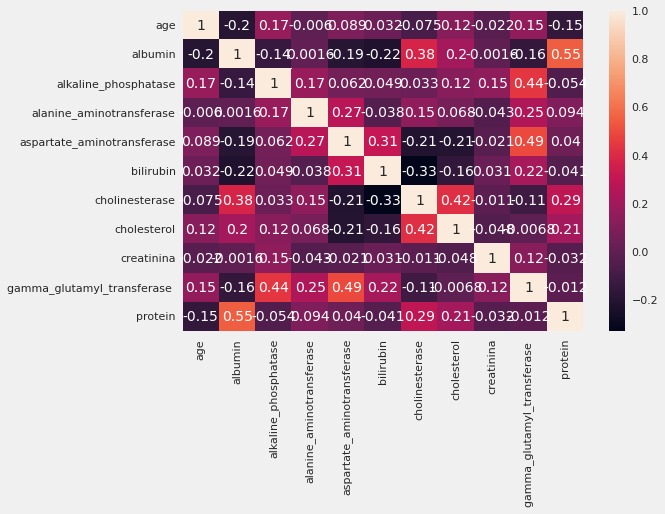

In [ ]:
# Correlation matrix
corr = data.corr()
sns.heatmap(corr, annot=True)
plt.show()

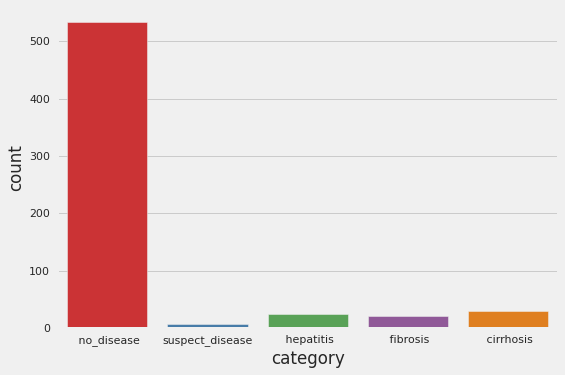

In [ ]:
# Distribution of the target variable
sns.countplot(data['category'])
plt.show()


In [ ]:
#separating non numerical and numerical values 
#Selecting numerical features
numerical_data = data.select_dtypes(include='number')
nonnumerical_data = data.select_dtypes(exclude='number')
nonnumerical_data

,category,sex
0,no_disease,m
1,no_disease,m
2,no_disease,m
3,no_disease,m
4,no_disease,m
...,...,...
610,cirrhosis,f
611,cirrhosis,f
612,cirrhosis,f
613,cirrhosis,f


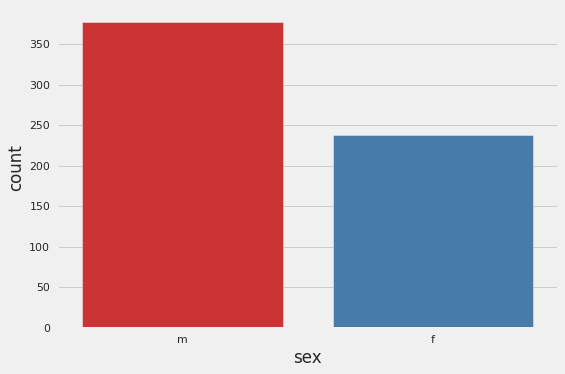

In [ ]:
# Distribution of the target variable
sns.countplot(nonnumerical_data['sex'])
plt.show()


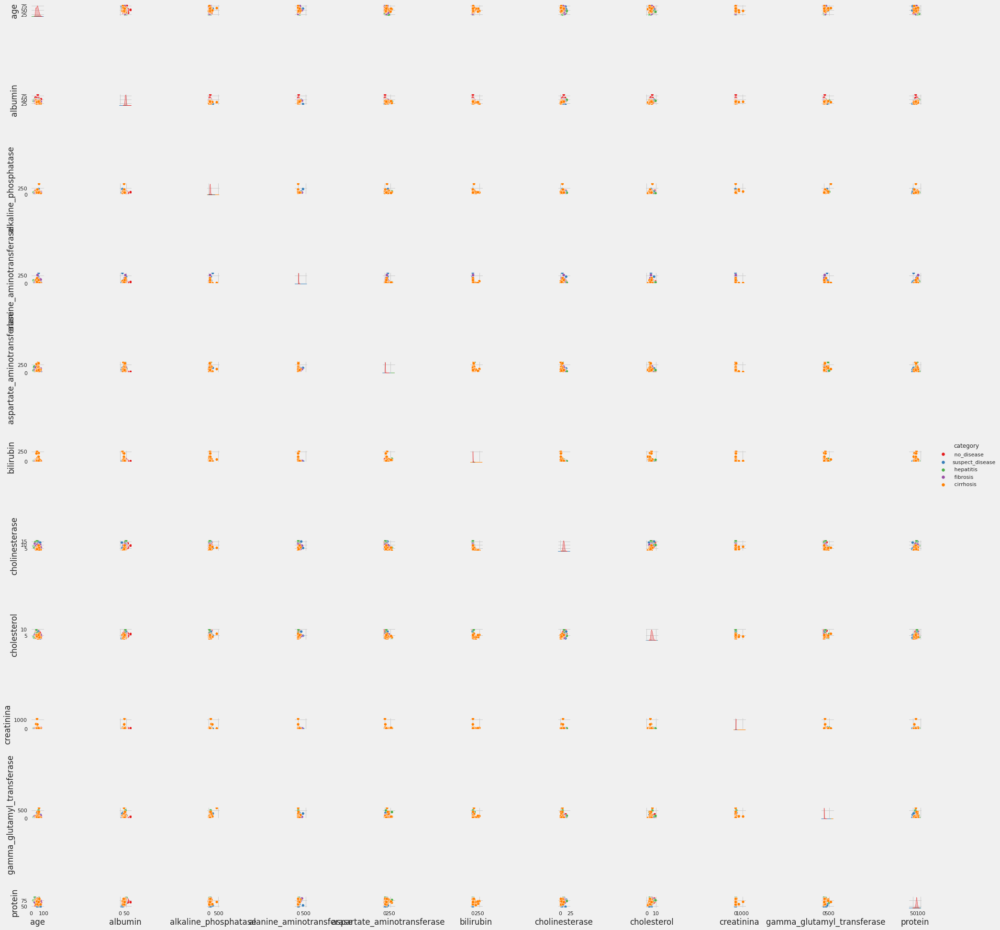

In [ ]:
# Multivariate analysis
sns.pairplot(data, hue='category')
plt.show()

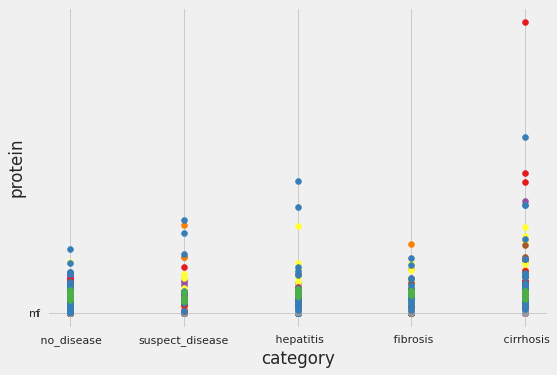

In [ ]:
# Create multiple scatterplots
for col in data.columns[1:]:
    plt.scatter(data['category'], data[col])
    plt.xlabel('category')
    plt.ylabel(col)
    plt.show()

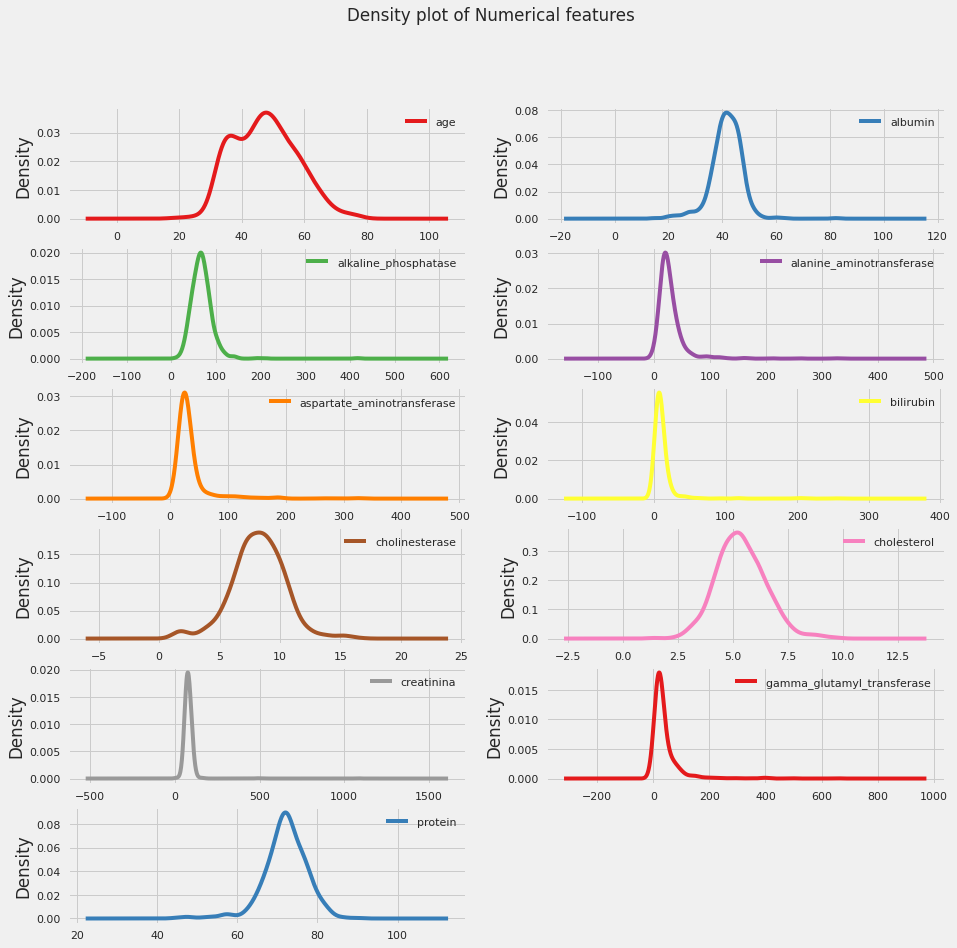

In [ ]:
numerical_data.plot(kind='density',figsize=(14,14),subplots=True,layout=(6,2),title="Density plot of Numerical features",sharex=False)
plt.show()